In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/asl-signs/sign_to_prediction_index_map.json
/kaggle/input/asl-signs/train.csv
/kaggle/input/asl-signs/train_landmark_files/36257/3762317508.parquet
/kaggle/input/asl-signs/train_landmark_files/36257/1613088982.parquet
/kaggle/input/asl-signs/train_landmark_files/36257/4161325779.parquet
/kaggle/input/asl-signs/train_landmark_files/36257/1550132028.parquet
/kaggle/input/asl-signs/train_landmark_files/36257/4030256468.parquet
/kaggle/input/asl-signs/train_landmark_files/36257/3881172779.parquet
/kaggle/input/asl-signs/train_landmark_files/36257/3160615357.parquet
/kaggle/input/asl-signs/train_landmark_files/36257/2532791067.parquet
/kaggle/input/asl-signs/train_landmark_files/36257/2986546609.parquet
/kaggle/input/asl-signs/train_landmark_files/36257/338972005.parquet
/kaggle/input/asl-signs/train_landmark_files/36257/1269431326.parquet
/kaggle/input/asl-signs/train_landmark_files/36257/512679055.parquet
/kaggle/input/asl-signs/train_landmark_files/36257/1774941909.parquet


In [2]:
df = pd.read_csv("/kaggle/input/asl-signs/train.csv")
df.head()


,path,participant_id,sequence_id,sign
0,train_landmark_files/26734/1000035562.parquet,26734,1000035562,blow
1,train_landmark_files/28656/1000106739.parquet,28656,1000106739,wait
2,train_landmark_files/16069/100015657.parquet,16069,100015657,cloud
3,train_landmark_files/25571/1000210073.parquet,25571,1000210073,bird
4,train_landmark_files/62590/1000240708.parquet,62590,1000240708,owie


In [3]:
participants = df['participant_id'].value_counts()
num_participants = len(participants)
print(num_participants)

21


In [4]:
print(df.shape)

(94477, 4)


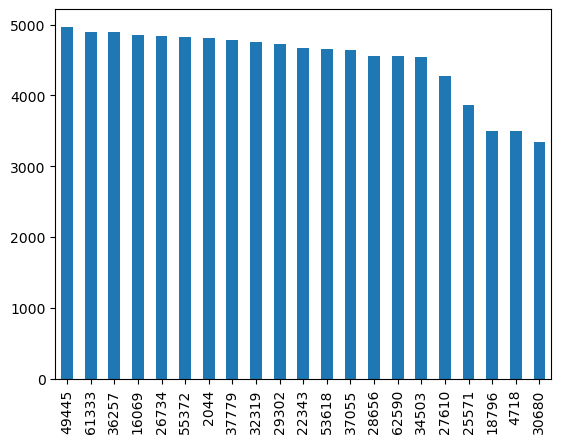

In [5]:
ax = participants.plot.bar()

In [6]:
sid = df['sequence_id'].unique()
print(len(sid))
# Sequence id is unique to each row

94477


In [7]:
signs = df['sign'].value_counts()
print(len(signs))
# bx = signs.plot.bar()

250


In [8]:
signs

listen    415
look      414
shhh      411
donkey    410
mouse     408
         ... 
dance     312
person    312
beside    310
vacuum    307
zipper    299
Name: sign, Length: 250, dtype: int64

In [9]:
diff = signs.iloc[0] - signs.iloc[-1] #Max difference in entries
print(diff)

116


In [10]:
sample_data = pd.read_parquet("/kaggle/input/asl-signs/train_landmark_files/26734/1000035562.parquet")
sample_data

,frame,row_id,type,landmark_index,x,y,z
0,20,20-face-0,face,0,0.494400,0.380470,-0.030626
1,20,20-face-1,face,1,0.496017,0.350735,-0.057565
2,20,20-face-2,face,2,0.500818,0.359343,-0.030283
3,20,20-face-3,face,3,0.489788,0.321780,-0.040622
4,20,20-face-4,face,4,0.495304,0.341821,-0.061152
...,...,...,...,...,...,...,...
12484,42,42-right_hand-16,right_hand,16,0.001660,0.549574,-0.145409
12485,42,42-right_hand-17,right_hand,17,0.042694,0.693116,-0.085307
12486,42,42-right_hand-18,right_hand,18,0.006723,0.665044,-0.114017
12487,42,42-right_hand-19,right_hand,19,-0.014755,0.643799,-0.123488


In [11]:
types = sample_data.groupby('frame')['type'].value_counts()
print(types)

frame  type      
20     face          468
       pose           33
       left_hand      21
       right_hand     21
21     face          468
                    ... 
41     right_hand     21
42     face          468
       pose           33
       left_hand      21
       right_hand     21
Name: type, Length: 92, dtype: int64


In [12]:
# Face feature clustering for each frame or drop the face features
# Pose features using region moments or simple distances use it as it is
# right hand and left hand features using distances use it as it is
# If face features dropped, 33 + 21 + 21 = 75 features per frame

In [13]:
face = sample_data[sample_data['type']=='face']
face = face.drop(['z', "row_id", 'type'], axis = 1)
face.head(10)

,frame,landmark_index,x,y
0,20,0,0.494400,0.380470
1,20,1,0.496017,0.350735
2,20,2,0.500818,0.359343
3,20,3,0.489788,0.321780
4,20,4,0.495304,0.341821
5,20,5,0.496499,0.330019
6,20,6,0.501039,0.301457
7,20,7,0.436136,0.306364
8,20,8,0.501792,0.282995
9,20,9,0.501045,0.271745


In [14]:
import pandas as pd
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt


def clustering(df):
    # extract the values of the two columns
    X = df.iloc[:, [2, 3]].values
#     print(X)

    # set the number of clusters (k)
    k = 5

    # create a k-means object
    kmeans = KMeans(n_clusters=k)

    # fit the k-means object to the data
    kmeans.fit(X)

    # get the cluster labels for each data point
    labels = kmeans.predict(X)

    # get the centroids for each cluster
    centroids = kmeans.cluster_centers_ 
    
        
    
    # plot the data and the centroids
    plt.scatter(X[:, 0], X[:, 1], c=labels)
    plt.scatter(centroids[:, 0], centroids[:, 1], marker='*', s=200, c='r')
    plt.show()
    
    return centroids


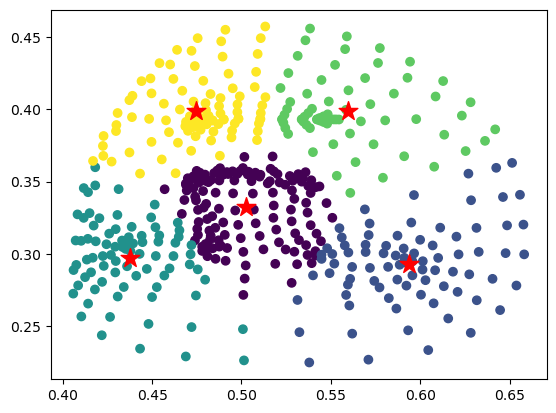

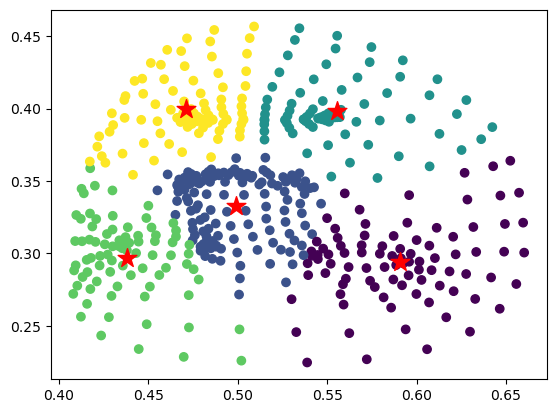

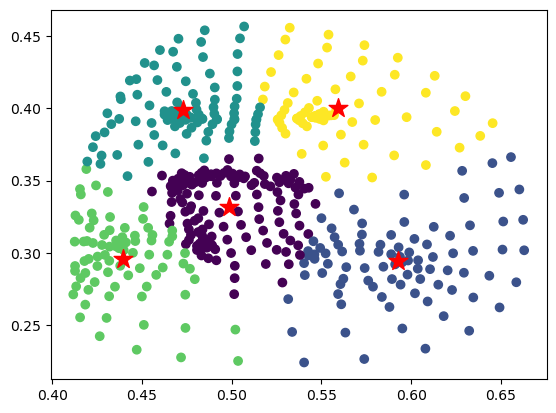

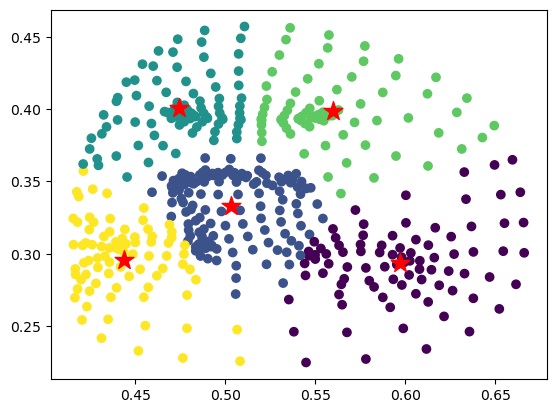

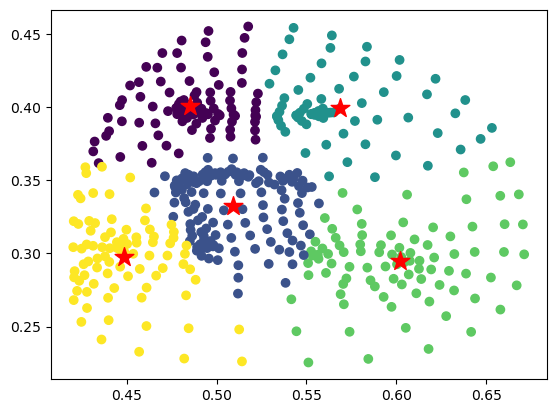

...

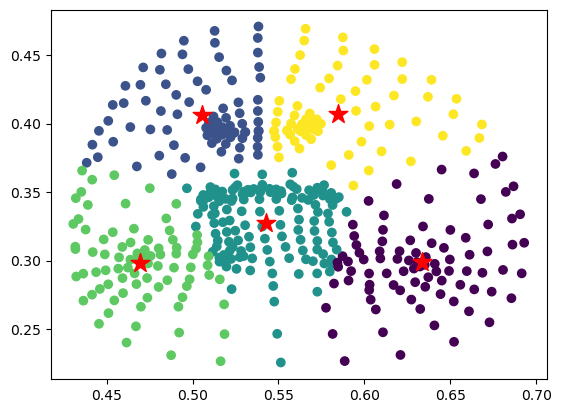

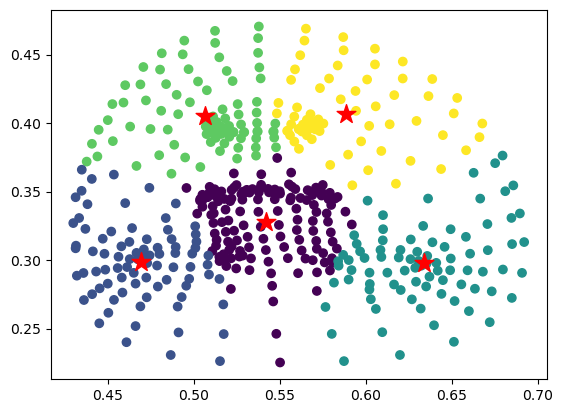

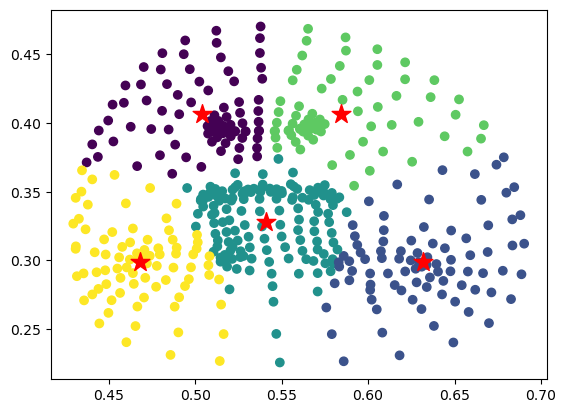

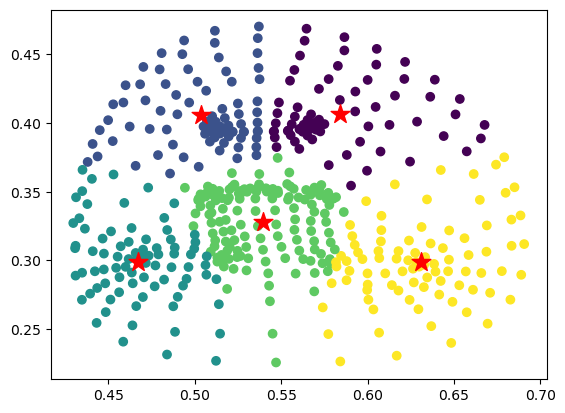

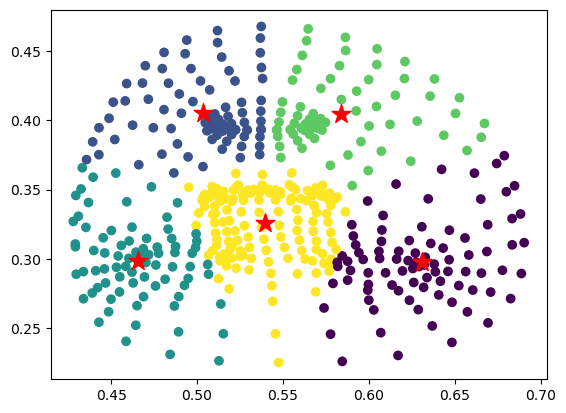

{'c1_x': [0.5024373794043505, 0.5907394678405161, 0.4983658315543842, 0.5973016975939958, 0.4850841487708845, 0.6083372687471323, 0.6141168143261561, 0.46513416112205125, 0.4970897673890832, 0.505005616908786, 0.5847826237614091, 0.5440288669821145, 0.5445204111082214, 0.5450479276746297, 0.5874021125806345, 0.5070219077169895, 0.6345665642384731, 0.63505496992462, 0.6338009286200864, 0.5420515078434841, 0.5041583190704214, 0.5839750807579249, 0.6305902881183842], 'c1_y': [0.33223188718159996, 0.2942613739980741, 0.3314870504060186, 0.2939008654191576, 0.40107063933422693, 0.2936961918041623, 0.294549585743384, 0.2931210155840274, 0.404966841253002, 0.4063994541935536, 0.40831040127857315, 0.32870744287535764, 0.3282218731939792, 0.32811068030570045, 0.4070749021059757, 0.40594099191102123, 0.2998730533578423, 0.2999258620300513, 0.29933501882799735, 0.32774437181383587, 0.40629342095605264, 0.40645937927781717, 0.29792897351856895], 'c2_x': [0.593842924359333, 0.4988459826425741, 0.59

In [15]:
frames = face['frame'].unique()
cents = {'c1_x':[],'c1_y':[],'c2_x':[],'c2_y':[],'c3_x':[],'c3_y':[],'c4_x':[],'c4_y':[],'c5_x':[],'c5_y':[]}
for f in frames:
         
         df = face[face['frame']==f]
         centroids = clustering(df)
         cents['c1_x'].append(centroids[0][0])
         cents['c1_y'].append(centroids[0][1])
         cents['c2_x'].append(centroids[1][0])
         cents['c2_y'].append(centroids[1][1])
         cents['c3_x'].append(centroids[2][0])
         cents['c3_y'].append(centroids[2][1])
         cents['c4_x'].append(centroids[3][0])
         cents['c4_y'].append(centroids[3][1])
         cents['c5_x'].append(centroids[4][0])
         cents['c5_y'].append(centroids[4][1])                        
print(cents)

In [16]:
centroids = pd.DataFrame(cents)
centroids
# # concatenate the arrays along axis 1 (columns)
# arr_concat = np.concatenate([arr for arr in all_cent], axis=1)
# print(arr_concat)

# # create a DataFrame from the concatenated array
# face_proc = pd.DataFrame(arr_concat, columns=['c1','c2','c3','c4','c5'])
# face_proc

,c1_x,c1_y,c2_x,c2_y,c3_x,c3_y,c4_x,c4_y,c5_x,c5_y
0,0.502437,0.332232,0.593843,0.293289,0.437368,0.297249,0.559600,0.398404,0.474613,0.398659
1,0.590739,0.294261,0.498846,0.332389,0.555247,0.398460,0.437812,0.296785,0.471161,0.399516
2,0.498366,0.331487,0.592513,0.294623,0.473113,0.398858,0.439209,0.295812,0.559339,0.399928
3,0.597302,0.293901,0.503362,0.332744,0.474507,0.400542,0.559631,0.398507,0.443756,0.295791
4,0.485084,0.401071,0.509087,0.332578,0.568939,0.399709,0.601835,0.294673,0.448415,0.297355
5,0.608337,0.293696,0.491633,0.399663,0.454929,0.295949,0.513849,0.331930,0.572075,0.399512
6,0.614117,0.294550,0.460908,0.294305,0.495514,0.399948,0.575276,0.401434,0.519201,0.331144
7,0.465134,0.293121,0.573059,0.402234,0.492284,0.401060,0.619183,0.295818,0.522667,0.329749
8,0.497090,0.404967,0.624848,0.297550,0.530011,0.330453,0.467205,0.295619,0.578153,0.404876
9,0.505006,0.406399,0.632399,0.300132,0.539987,0.328648,0.469127,0.298714,0.583644,0.407218


In [17]:
face_proc = centroids
face_proc['frame'] = frames
face_proc

,c1_x,c1_y,c2_x,c2_y,c3_x,c3_y,c4_x,c4_y,c5_x,c5_y,frame
0,0.502437,0.332232,0.593843,0.293289,0.437368,0.297249,0.559600,0.398404,0.474613,0.398659,20
1,0.590739,0.294261,0.498846,0.332389,0.555247,0.398460,0.437812,0.296785,0.471161,0.399516,21
2,0.498366,0.331487,0.592513,0.294623,0.473113,0.398858,0.439209,0.295812,0.559339,0.399928,22
3,0.597302,0.293901,0.503362,0.332744,0.474507,0.400542,0.559631,0.398507,0.443756,0.295791,23
4,0.485084,0.401071,0.509087,0.332578,0.568939,0.399709,0.601835,0.294673,0.448415,0.297355,24
5,0.608337,0.293696,0.491633,0.399663,0.454929,0.295949,0.513849,0.331930,0.572075,0.399512,25
6,0.614117,0.294550,0.460908,0.294305,0.495514,0.399948,0.575276,0.401434,0.519201,0.331144,26
7,0.465134,0.293121,0.573059,0.402234,0.492284,0.401060,0.619183,0.295818,0.522667,0.329749,27
8,0.497090,0.404967,0.624848,0.297550,0.530011,0.330453,0.467205,0.295619,0.578153,0.404876,28
9,0.505006,0.406399,0.632399,0.300132,0.539987,0.328648,0.469127,0.298714,0.583644,0.407218,29
